This notebook is an attempt to use the methods outlined in the [fastai library](https://github.com/fastai/fastai) and the fast.ai course ['Practical Deep Learning for Coders'](http://course.fast.ai) to learn the relationship between a book's genre and its cover design. This was first done using convolutional neural networks in [Iwana et.al's *Judging a Book by its Cover*](https://arxiv.org/abs/1610.09204). According to the paper, this is a *very challenging dataset*, so its worth it to try these techniques. Transfer learning was done already, so 1Cycle, discriminative learning and test-time augmentation are - as yet - untried. To get started, download the dataset's dowload script (my fork): [link](https://github.com/poppingtonic/book-dataset).
This script will install pandas, tqdm and joblib (for parallelization) before it starts the download process. It will take a long time (7 hours in an AWS instance, with default parallelization).
```
git clone https://github.com/poppingtonic/book-dataset book-dataset-master
cd book-dataset-master
bash download_images.sh
```

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
from fastai import *
from fastai.vision import *
PATH = Path('/data2/book-dataset-master')

In [4]:
PATH.ls()

[PosixPath('/data2/book-dataset-master/LICENSE'),
 PosixPath('/data2/book-dataset-master/README.md'),
 PosixPath('/data2/book-dataset-master/download_images.sh'),
 PosixPath('/data2/book-dataset-master/download_images.py'),
 PosixPath('/data2/book-dataset-master/ipython_history.txt'),
 PosixPath('/data2/book-dataset-master/clear_improper.py'),
 PosixPath('/data2/book-dataset-master/Task1'),
 PosixPath('/data2/book-dataset-master/Task2'),
 PosixPath('/data2/book-dataset-master/docs'),
 PosixPath('/data2/book-dataset-master/images'),
 PosixPath('/data2/book-dataset-master/labels.csv'),
 PosixPath('/data2/book-dataset-master/train'),
 PosixPath('/data2/book-dataset-master/test'),
 PosixPath('/data2/book-dataset-master/val'),
 PosixPath('/data2/book-dataset-master/tmp'),
 PosixPath('/data2/book-dataset-master/models'),
 PosixPath('/data2/book-dataset-master/.ipynb_checkpoints'),
 PosixPath('/data2/book-dataset-master/judging-a-book-by-its-cover.ipynb')]

In [5]:
df = pd.read_csv(PATH/'labels.csv')

In [6]:
df.head()

,file_name,book_class
0,1588345297.jpg,1
1,1404803335.jpg,4
2,1446276082.jpg,10
3,1491522666.jpg,9
4,0970096410.jpg,26


In [ ]:
np.random.seed()
data = (ImageFileList.from_folder(PATH)
        .label_from_csv('labels.csv', fn_col=0, label_col=1, folder='train', sep=None)
        .random_split_by_pct(0.2)
        .datasets(ImageClassificationDataset)
        .transform(tfms, size=224)
        .databunch()
        .normalize(imagenet_stats))

In [13]:
help(get_transforms)

Help on function get_transforms in module fastai.vision.transform:

get_transforms(do_flip:bool=True, flip_vert:bool=False, max_rotate:float=10.0, max_zoom:float=1.1, max_lighting:float=0.2, max_warp:float=0.2, p_affine:float=0.75, p_lighting:float=0.75, xtra_tfms:float=None) -> Collection[fastai.vision.image.Transform]
    Utility func to easily create a list of flip, rotate, `zoom`, warp, lighting transforms.



In [27]:
tfms = get_transforms(max_zoom=1.3, max_warp=0.4)
data = ImageDataBunch.from_csv(PATH, folder='train', csv_labels='labels.csv', fn_col=0, label_col=1,
                               valid_pct=0.2, test='test', ds_tfms=tfms, size=224)

In [28]:
learn = create_cnn(data, models.resnet50, metrics=accuracy)
learn.fit(1)

Total time: 12:21
epoch  train_loss  valid_loss  accuracy
1      2.769927    2.673292    0.248650  (12:21)



![results from paper](biwana-results.png)

Slightly outperforming the original paper in one epoch seems interesting, so let see how challenging the dataset is, using the learning rate finder. First, we interpret the current results.

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

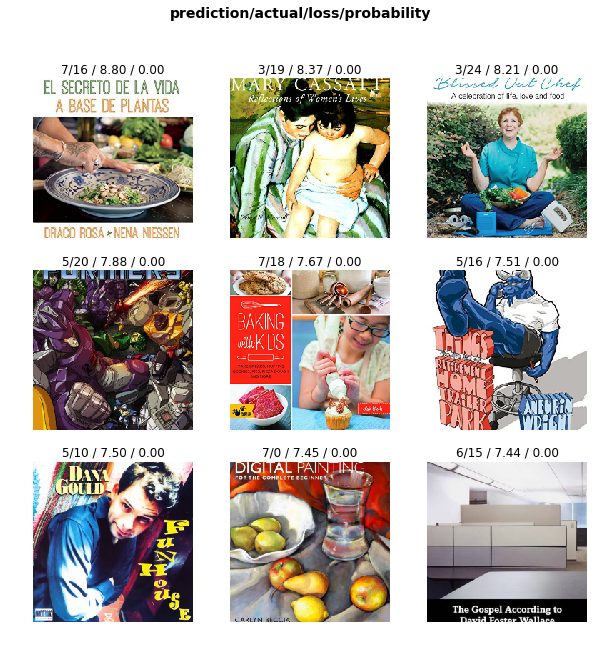

In [31]:
interp.plot_top_losses(9, figsize=(10, 10))

In [34]:
learn.lr_find(start_lr=1e-8)

LR Finder complete, type {learner_name}.recorder.plot() to see the graph.


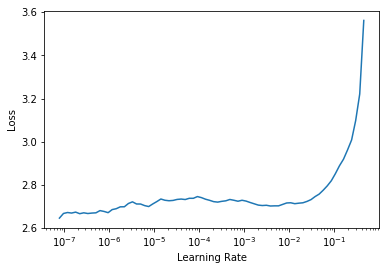

In [35]:
learn.recorder.plot()

This is evidence of how difficult this dataset is, even for resnet50. We don't see much movement going down and to the right. We'll pick `max_lr=1e-3`, and use `fit_one_cycle`.

In [36]:
learn.fit_one_cycle(10)

Total time: 1:58:32
epoch  train_loss  valid_loss  accuracy
1      2.628818    2.583755    0.276417  (11:49)
2      2.641676    2.581856    0.271886  (11:51)
3      2.673074    2.567547    0.276128  (11:51)
4      2.614371    2.559445    0.278249  (11:51)
5      2.585254    2.536840    0.281816  (11:51)
6      2.537534    2.498956    0.293868  (11:51)
7      2.489993    2.486178    0.300328  (11:51)
8      2.425542    2.467800    0.303509  (11:51)
9      2.391696    2.466458    0.306209  (11:51)
10     2.409380    2.464299    0.306595  (11:51)



In [37]:
learn.save('v1-stage-1')

In [38]:
interp = ClassificationInterpretation.from_learner(learn)

In [40]:
most_confused_stage_1 = interp.most_confused()

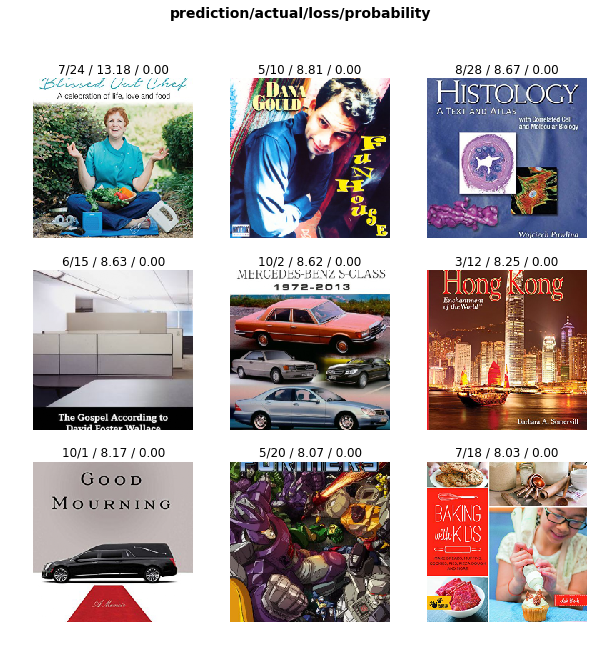

In [41]:
interp.plot_top_losses(9, figsize=(10, 10))

In [44]:
learn.lr_find(start_lr=1e-20)

LR Finder complete, type {learner_name}.recorder.plot() to see the graph.


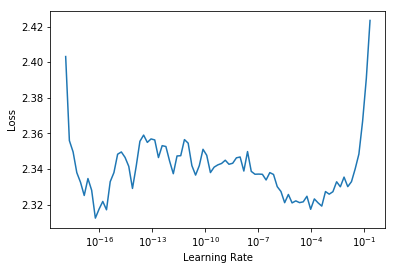

In [45]:
learn.recorder.plot()

In [47]:
learn.unfreeze()

In [48]:
learn.fit_one_cycle(10, max_lr=slice(7e-17, 1e-6))

Total time: 2:36:35
epoch  train_loss  valid_loss  accuracy
1      2.363076    2.464255    0.304281  (15:43)
2      2.364936    2.464356    0.304763  (15:39)
3      2.367379    2.462584    0.304956  (15:39)
4      2.349765    2.463625    0.304570  (15:39)
5      2.363815    2.472484    0.303606  (15:39)
6      2.390625    2.457523    0.306980  (15:38)
7      2.380962    2.465189    0.304281  (15:38)
8      2.363865    2.465492    0.305534  (15:39)
9      2.374975    2.462646    0.306402  (15:39)
10     2.376931    2.464012    0.304281  (15:39)



In [49]:
learn.save('v1-stage-2')

In [52]:
learn.lr_find(start_lr=1e-40)

LR Finder complete, type {learner_name}.recorder.plot() to see the graph.


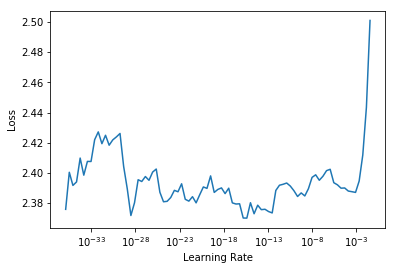

In [53]:
learn.recorder.plot()

In [55]:
learn.fit_one_cycle(10, max_lr=slice(8e-16, 1e-13))

Total time: 2:36:28
epoch  train_loss  valid_loss  accuracy
1      2.364175    2.466436    0.305727  (15:37)
2      2.384845    2.467148    0.304570  (15:39)
3      2.336583    2.465384    0.304088  (15:39)
4      2.386834    2.466408    0.306884  (15:36)
5      2.387648    2.466524    0.304184  (15:39)
6      2.356244    2.471281    0.306305  (15:39)
7      2.368204    2.462420    0.305438  (15:39)
8      2.357789    2.467741    0.306402  (15:39)
9      2.360074    2.459654    0.303606  (15:38)
10     2.376519    2.458306    0.304377  (15:40)



In [56]:
interp = ClassificationInterpretation.from_learner(learn)

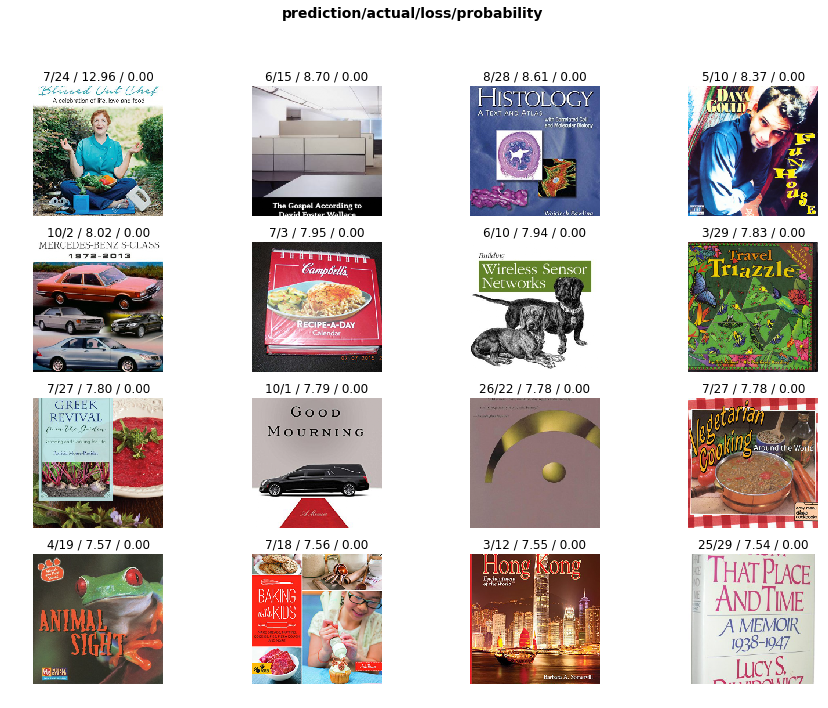

In [57]:
interp.plot_top_losses(16, figsize=(15, 11))

In [59]:
most_confused_stage_3 = interp.most_confused()

### T-SNE Visualization

In [60]:
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn import manifold
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.metrics import confusion_matrix
from scipy.spatial.distance import squareform
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.ticker import NullFormatter
import PIL

In [61]:
preds = interp.probs
y = interp.y_true

In [62]:
preds[500]

tensor([0.0031, 0.7565, 0.0010, 0.0117, 0.0078, 0.0049, 0.0060, 0.0141, 0.0011,
        0.0008, 0.0128, 0.0266, 0.0076, 0.0106, 0.0293, 0.0006, 0.0024, 0.0003,
        0.0272, 0.0150, 0.0073, 0.0005, 0.0048, 0.0054, 0.0100, 0.0090, 0.0064,
        0.0108, 0.0045, 0.0019])

In [63]:
np.argmax(preds[500])

tensor(1)

In [67]:
F.softmax(preds[500], dim=0)

tensor([0.0320, 0.0679, 0.0319, 0.0322, 0.0321, 0.0320, 0.0321, 0.0323, 0.0319,
        0.0319, 0.0323, 0.0327, 0.0321, 0.0322, 0.0328, 0.0319, 0.0319, 0.0319,
        0.0328, 0.0324, 0.0321, 0.0319, 0.0320, 0.0320, 0.0322, 0.0322, 0.0321,
        0.0322, 0.0320, 0.0319])

In [68]:
learn.data.valid_ds.ds.classes[np.argmax(to_np(F.softmax(preds[500], dim=0)))]

4

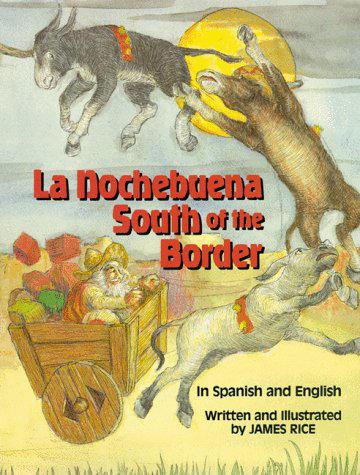

In [70]:
PIL.Image.open(learn.data.valid_ds.x[500])

In [71]:
probs_trans = TSNE(n_components=2, perplexity=15).fit_transform(preds)

In [72]:
prob_df = pd.DataFrame(np.concatenate((probs_trans, y[:, None]), 
                                      axis=1), columns=['x', 'y', 'labels'])

In [73]:
prob_df.head(25)

,x,y,labels
0,-25.123447,52.321518,5.0
1,-43.383179,38.273739,8.0
2,-17.086916,-60.844933,9.0
3,-24.397560,-2.772443,10.0
4,-32.135788,60.287151,5.0
5,-59.087189,22.997723,6.0
6,-11.270606,-0.412653,16.0
7,3.655462,2.573449,7.0
8,-22.225687,-38.554531,16.0
9,38.357452,-44.464260,12.0


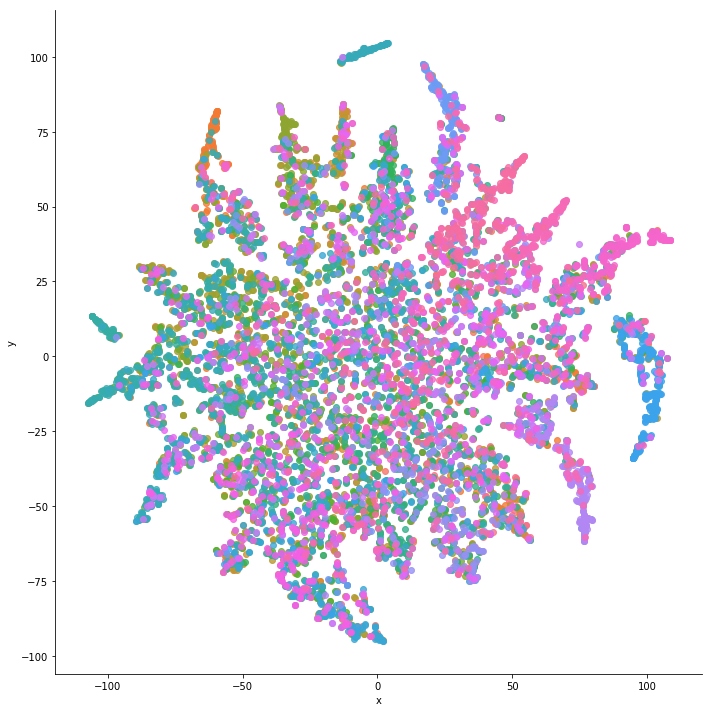

In [74]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

In [75]:
prob_df['fname'] = learn.data.valid_ds.x

In [76]:
prob_df.head(3)

,x,y,labels,fname
0,-25.123447,52.321518,5.0,/data2/book-dataset-master/train/8436808053.jpg
1,-43.383179,38.273739,8.0,/data2/book-dataset-master/train/1760342769.jpg
2,-17.086916,-60.844933,9.0,/data2/book-dataset-master/train/0137029039.jpg


In [78]:
def visualize_scatter_with_images(scaled_data, df, figsize=(64, 64), image_zoom=1, suffix=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    xx = scaled_data[:, 0]
    yy = scaled_data[:, 1]
    
    for i, (x, y) in enumerate(zip(xx, yy)):
        im = PIL.Image.open(df['fname'][i])
        im.thumbnail((64, 64))
        img = OffsetImage(im, zoom=image_zoom, cmap='gray')
        ab = AnnotationBbox(img, (x, y), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([xx, yy]))
    ax.autoscale()
    fig.savefig(f'TSNE_{suffix}', bbox_inches='tight')
    return fig, ax

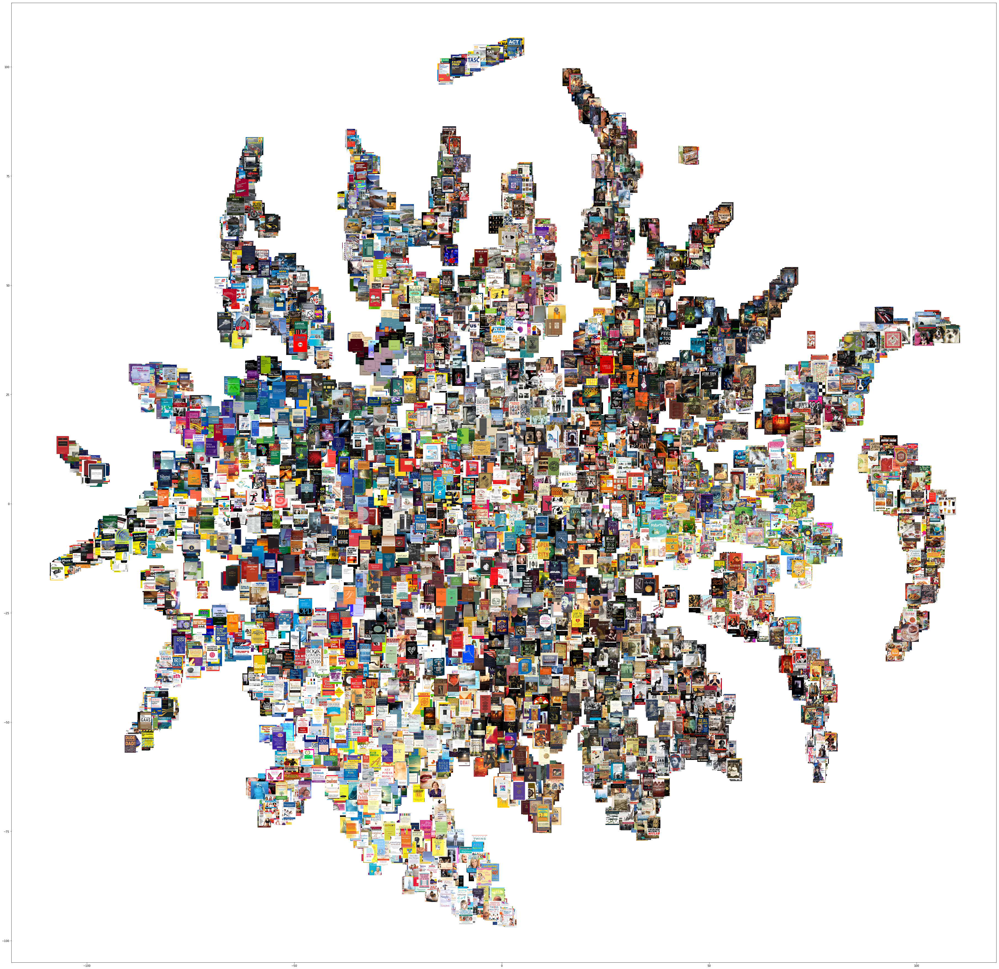

In [79]:
fig, ax = visualize_scatter_with_images(probs_trans, prob_df, image_zoom=1, suffix='probabilities')
plt.show()

In [80]:
tta_interp = ClassificationInterpretation.from_learner(learn, tta=True)

Total time: 11:01



In [81]:
test_preds = learn.TTA(is_test=True)

Total time: 06:16



In [84]:
test_preds

(tensor([[0.0000, 0.0088, 0.0002,  ..., 0.9743, 0.0001, 0.0000],
         [0.0025, 0.1981, 0.0017,  ..., 0.5985, 0.0199, 0.0124],
         [0.0000, 0.0266, 0.0005,  ..., 0.9477, 0.0002, 0.0001],
         ...,
         [0.0831, 0.0182, 0.0279,  ..., 0.0406, 0.0211, 0.0285],
         [0.0170, 0.0058, 0.0232,  ..., 0.0410, 0.0083, 0.0072],
         [0.0629, 0.0044, 0.0085,  ..., 0.0190, 0.0448, 0.0572]]),
 tensor([0, 0, 0,  ..., 0, 0, 0]))

In [87]:
tta_interp.most_confused()

[(18, 25, 52),
 (11, 25, 47),
 (5, 24, 42),
 (2, 6, 39),
 (2, 14, 38),
 (21, 9, 38),
 (16, 6, 37),
 (11, 16, 36),
 (19, 14, 36),
 (1, 12, 35),
 (23, 16, 34),
 (20, 28, 34),
 (19, 25, 33),
 (10, 6, 32),
 (16, 14, 32),
 (21, 25, 32),
 (15, 17, 32),
 (25, 18, 32),
 (4, 5, 31),
 (15, 21, 31),
 (15, 12, 31),
 (6, 16, 31),
 (2, 25, 30),
 (27, 22, 30),
 (23, 14, 29),
 (15, 22, 29),
 (26, 1, 28),
 (19, 21, 28),
 (24, 17, 28),
 (10, 23, 27),
 (26, 29, 27),
 (13, 1, 27),
 (14, 16, 27),
 (12, 1, 26),
 (27, 1, 26),
 (1, 26, 25),
 (11, 18, 25),
 (14, 2, 25),
 (12, 14, 25),
 (27, 26, 25),
 (4, 3, 24),
 (21, 12, 24),
 (14, 6, 24),
 (18, 1, 24),
 (5, 4, 24),
 (25, 2, 24),
 (9, 21, 23),
 (9, 14, 23),
 (29, 14, 23),
 (19, 1, 23),
 (19, 2, 23),
 (6, 14, 23),
 (0, 3, 23),
 (27, 4, 23),
 (24, 5, 23),
 (9, 1, 22),
 (9, 12, 22),
 (11, 7, 22),
 (2, 16, 22),
 (19, 9, 22),
 (21, 14, 22),
 (13, 5, 22),
 (22, 17, 22),
 (20, 29, 22),
 (20, 14, 22),
 (27, 12, 22),
 (24, 22, 22),
 (16, 23, 21),
 (23, 6, 21),
 (29, 1